##Usando Backtracking y python para cadenas cortas


Alineamiento Bacteria y Sars-cov:


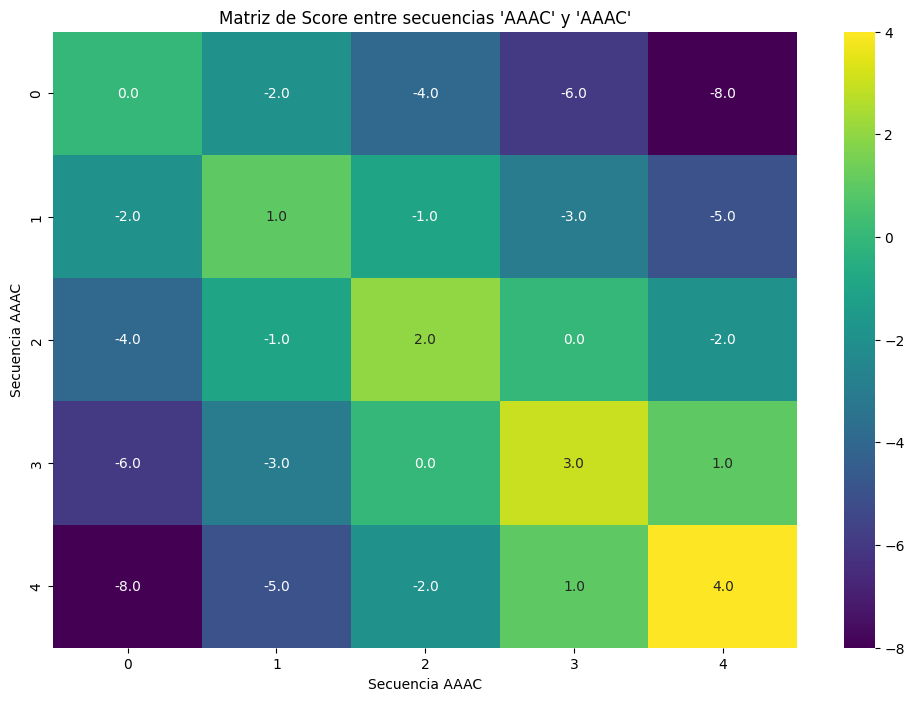

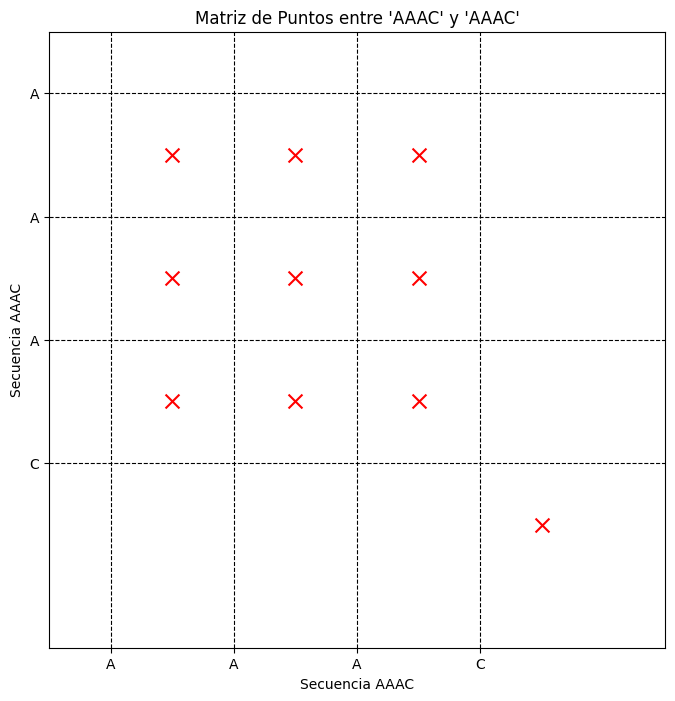


Alineamientos Óptimos:

Alineamiento:
AAAC
AAAC
Gaps: 0, Mismatches: 0

El alineamiento más óptimo es:
AAAC
AAAC
Gaps: 0, Mismatches: 0

Alineamiento Sars-cov e Influenza:


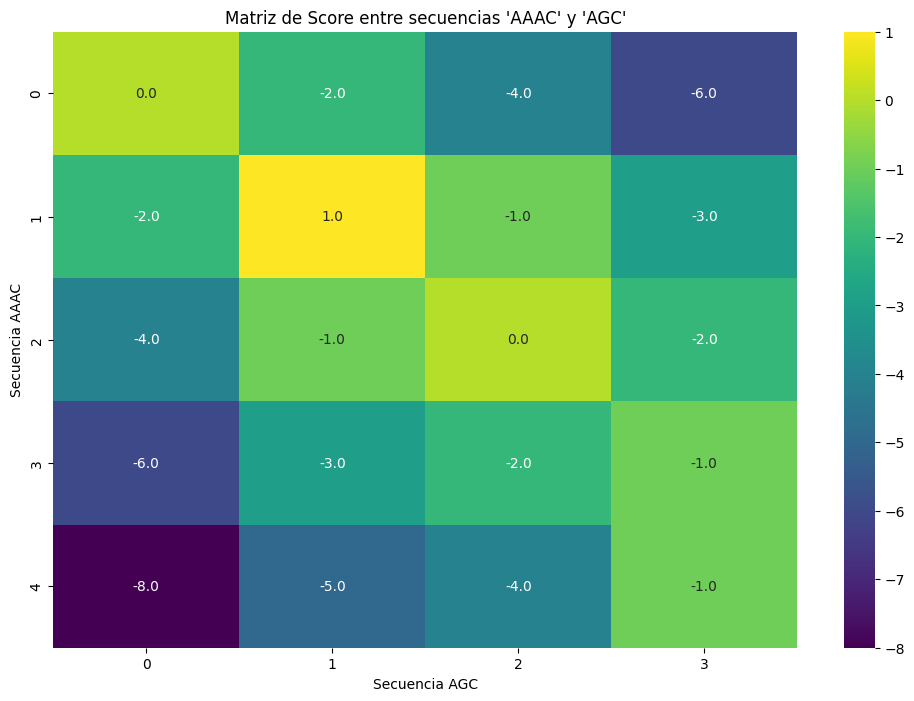

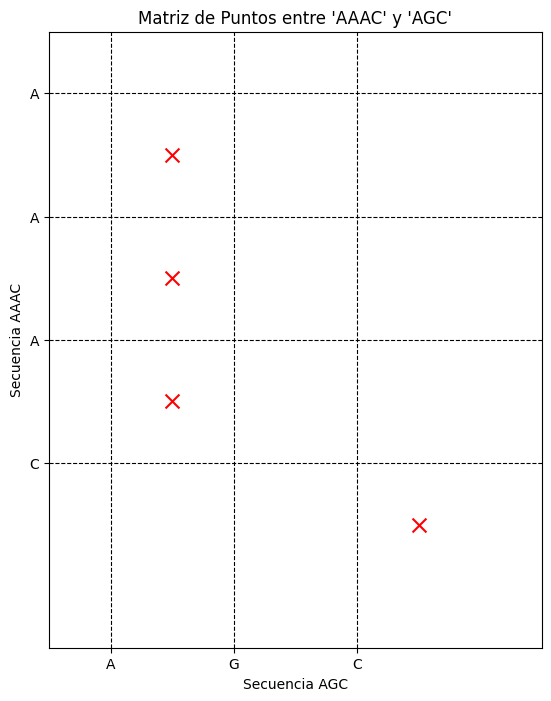


Alineamientos Óptimos:

Alineamiento:
AAAC
-AGC
Gaps: 1, Mismatches: 1

Alineamiento:
AAAC
A-GC
Gaps: 1, Mismatches: 1

Alineamiento:
AAAC
AG-C
Gaps: 1, Mismatches: 1

El alineamiento más óptimo es:
AAAC
-AGC
Gaps: 1, Mismatches: 1

Alineamiento Bacteria e Influenza:


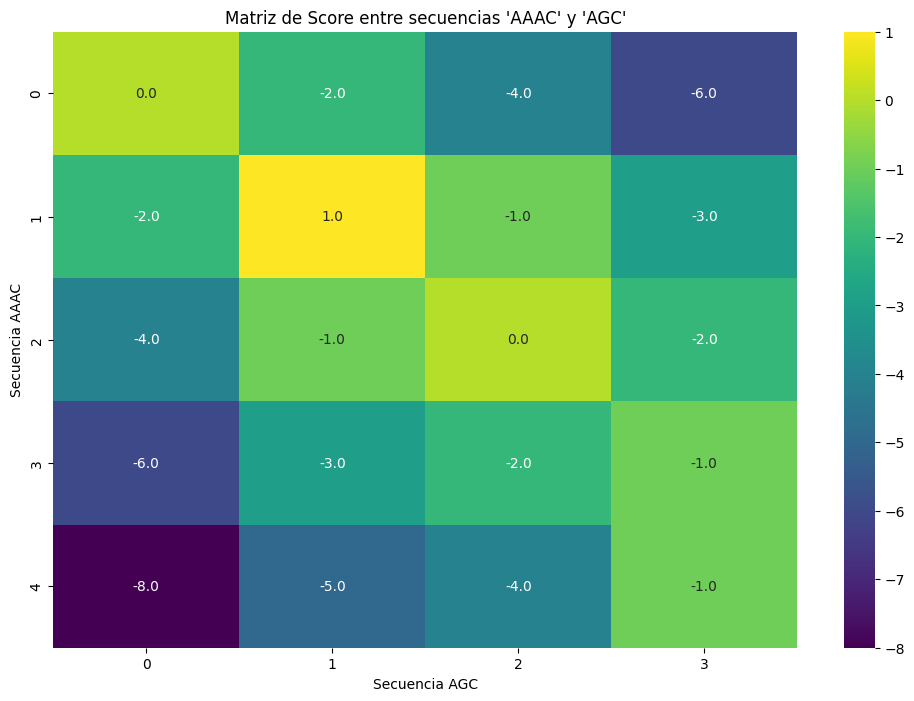

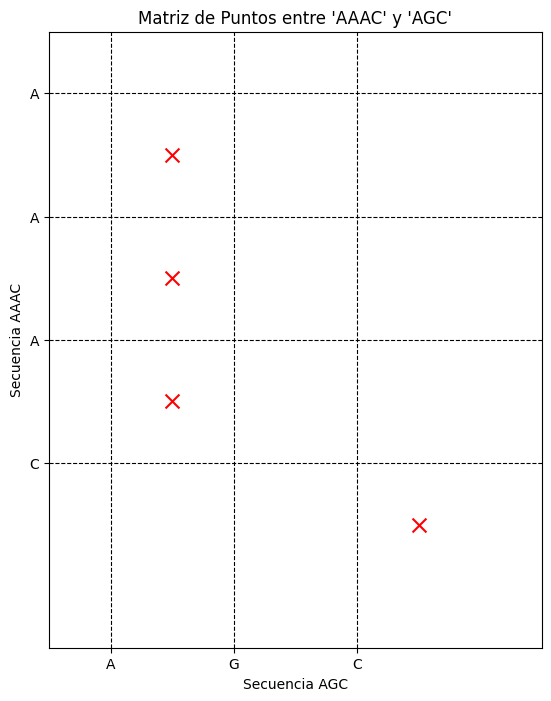


Alineamientos Óptimos:

Alineamiento:
AAAC
-AGC
Gaps: 1, Mismatches: 1

Alineamiento:
AAAC
A-GC
Gaps: 1, Mismatches: 1

Alineamiento:
AAAC
AG-C
Gaps: 1, Mismatches: 1

El alineamiento más óptimo es:
AAAC
-AGC
Gaps: 1, Mismatches: 1


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

class Alignment:
    def __init__(self, aligned_s, aligned_t, num_gaps, num_mismatches):
        self.aligned_s = aligned_s
        self.aligned_t = aligned_t
        self.num_gaps = num_gaps
        self.num_mismatches = num_mismatches

def needleman_wunsch(s, t, match=1, mismatch=-1, gap=-2):
    n = len(s)
    m = len(t)
    M = np.zeros((n+1, m+1))

    # Inicialización de la primera fila y columna
    for i in range(1, n+1):
        M[i][0] = i * gap
    for j in range(1, m+1):
        M[0][j] = j * gap

    # Relleno de la matriz
    for i in range(1, n+1):
        for j in range(1, m+1):
            score_diagonal = M[i-1][j-1] + (match if s[i-1] == t[j-1] else mismatch)
            score_up = M[i-1][j] + gap
            score_left = M[i][j-1] + gap
            M[i][j] = max(score_diagonal, score_up, score_left)

    return M

def traceback(M, s, t, match, mismatch, gap):
    alignments = []

    def recursive_traceback(aligned_s, aligned_t, i, j):
        if i == 0 and j == 0:
            num_gaps = aligned_s.count('-') + aligned_t.count('-')
            num_mismatches = sum(1 for k in range(len(aligned_s)) if aligned_s[k] != aligned_t[k] and aligned_s[k] != '-' and aligned_t[k] != '-')
            alignments.append(Alignment(aligned_s, aligned_t, num_gaps, num_mismatches))
            return

        if i > 0 and j > 0 and M[i][j] == M[i-1][j-1] + (match if s[i-1] == t[j-1] else mismatch):
            recursive_traceback(s[i-1] + aligned_s, t[j-1] + aligned_t, i-1, j-1)
        if i > 0 and M[i][j] == M[i-1][j] + gap:
            recursive_traceback(s[i-1] + aligned_s, '-' + aligned_t, i-1, j)
        if j > 0 and M[i][j] == M[i][j-1] + gap:
            recursive_traceback('-' + aligned_s, t[j-1] + aligned_t, i, j-1)

    recursive_traceback('', '', len(s), len(t))
    return alignments

def visualize_alignment(s, t, M, alignments):
    # Visualización de la Matriz de Score
    plt.figure(figsize=(12, 8))
    sns.heatmap(M, annot=True, fmt=".1f", cmap='viridis')
    plt.title(f"Matriz de Score entre secuencias '{s}' y '{t}'")
    plt.xlabel(f"Secuencia {t}")
    plt.ylabel(f"Secuencia {s}")
    plt.show()

    # Visualización de la Matriz de Puntos
    plt.figure(figsize=(12, 8))
    plt.imshow(np.zeros((len(s)+1, len(t)+1)), cmap='Greys', interpolation='none')
    plt.title(f"Matriz de Puntos entre '{s}' y '{t}'")
    plt.xlabel(f"Secuencia {t}")
    plt.ylabel(f"Secuencia {s}")

    for i in range(len(s)):
        for j in range(len(t)):
            if s[i] == t[j]:
                plt.scatter(j + 0.5, i + 0.5, c='red', marker='x', s=100)

    plt.xticks(ticks=np.arange(len(t)), labels=t)
    plt.yticks(ticks=np.arange(len(s)), labels=s)
    plt.grid(True, linestyle='--', color='black')
    plt.show()

    # Imprimir todas las soluciones óptimas
    best_alignment = alignments[0]
    print("\nAlineamientos Óptimos:")
    for alignment in alignments:
        print("\nAlineamiento:")
        print(alignment.aligned_s)
        print(alignment.aligned_t)
        print(f"Gaps: {alignment.num_gaps}, Mismatches: {alignment.num_mismatches}")
        if alignment.num_gaps < best_alignment.num_gaps or (alignment.num_gaps == best_alignment.num_gaps and alignment.num_mismatches < best_alignment.num_mismatches):
            best_alignment = alignment

    # Imprimir el alineamiento más óptimo
    print("\nEl alineamiento más óptimo es:")
    print(best_alignment.aligned_s)
    print(best_alignment.aligned_t)
    print(f"Gaps: {best_alignment.num_gaps}, Mismatches: {best_alignment.num_mismatches}")

def main():

    """
    bacteria = "ATCGTACG"
    sars_cov = "ATGCTAC"
    influenza = "GCTTACG"
    """
    bacteria = "AAAC"
    sars_cov = "AAAC"
    influenza = "AGC"

    # Parámetros de alineación
    match = 1
    mismatch = -1
    gap = -2

    print("\nAlineamiento Bacteria y Sars-cov:")
    M = needleman_wunsch(bacteria, sars_cov, match, mismatch, gap)
    alignments = traceback(M, bacteria, sars_cov, match, mismatch, gap)
    visualize_alignment(bacteria, sars_cov, M, alignments)

    print("\nAlineamiento Sars-cov e Influenza:")
    M = needleman_wunsch(sars_cov, influenza, match, mismatch, gap)
    alignments = traceback(M, sars_cov, influenza, match, mismatch, gap)
    visualize_alignment(sars_cov, influenza, M, alignments)

    print("\nAlineamiento Bacteria e Influenza:")
    M = needleman_wunsch(bacteria, influenza, match, mismatch, gap)
    alignments = traceback(M, bacteria, influenza, match, mismatch, gap)
    visualize_alignment(bacteria, influenza, M, alignments)

if __name__ == "__main__":
    main()


##Preparando el entorno para ejecutar con CUDA

In [ ]:
!nvidia-smi

Wed Sep  4 06:48:38 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0


In [28]:
!apt-get -qq install -y libopencv-dev

In [29]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [30]:
%cd /content/drive/MyDrive/molecular/
%ls

/content/drive/MyDrive/molecular
bacteria.txt  influenza.txt  needleman_wunsch.ipynb  sars_cov.txt  testBact.txt  testInfl.txt


##Reconstrucción Basada en la Matriz de Puntuación (Programación dinámica) y el uso de CUDA para manejar la paralelización

In [47]:
%%writefile main.cu

#include <iostream>
#include <vector>
#include <string>
#include <algorithm>
#include <fstream>
#include <cuda_runtime.h>

using namespace std;

// Función para calcular el máximo de tres valores
__device__ int max(int a, int b, int c) {
    return max(max(a, b), c);
}

// Kernel para calcular la matriz de puntuación y la matriz de dirección
__global__ void needlemanWunschKernel(const char* s, const char* t, int* M, int* D, int n, int m, int match, int mismatch, int gap) {
    int i = blockIdx.x * blockDim.x + threadIdx.x;
    int j = blockIdx.y * blockDim.y + threadIdx.y;

    if (i <= n && j <= m) {
        if (i == 0) {
            M[i * (m + 1) + j] = j * gap;
            D[i * (m + 1) + j] = 2; // From left
        } else if (j == 0) {
            M[i * (m + 1) + j] = i * gap;
            D[i * (m + 1) + j] = 1; // From top
        } else {
            int scoreDiagonal = M[(i - 1) * (m + 1) + (j - 1)] + (s[i - 1] == t[j - 1] ? match : mismatch);
            int scoreUp = M[(i - 1) * (m + 1) + j] + gap;
            int scoreLeft = M[i * (m + 1) + (j - 1)] + gap;
            M[i * (m + 1) + j] = max(scoreDiagonal, scoreUp, scoreLeft);

            // Direction matrix
            if (M[i * (m + 1) + j] == scoreDiagonal) D[i * (m + 1) + j] = 0; // Diagonal
            else if (M[i * (m + 1) + j] == scoreUp) D[i * (m + 1) + j] = 1; // Up
            else D[i * (m + 1) + j] = 2; // Left
        }
    }
}

// Función para inicializar y lanzar los kernels CUDA
void needlemanWunsch(const string &s, const string &t, int match, int mismatch, int gap) {
    int n = s.length();
    int m = t.length();
    size_t size = (n + 1) * (m + 1) * sizeof(int);

    int *d_M, *d_D;
    char *d_s, *d_t;

    cudaMalloc(&d_M, size);
    cudaMalloc(&d_D, size);
    cudaMalloc(&d_s, s.size() * sizeof(char));
    cudaMalloc(&d_t, t.size() * sizeof(char));

    cudaMemcpy(d_s, s.c_str(), s.size() * sizeof(char), cudaMemcpyHostToDevice);
    cudaMemcpy(d_t, t.c_str(), t.size() * sizeof(char), cudaMemcpyHostToDevice);

    dim3 threadsPerBlock(16, 16);
    dim3 blocks((n + 1 + threadsPerBlock.x - 1) / threadsPerBlock.x, (m + 1 + threadsPerBlock.y - 1) / threadsPerBlock.y);

    cudaEvent_t start, stop;
    cudaEventCreate(&start);
    cudaEventCreate(&stop);
    cudaEventRecord(start);

    needlemanWunschKernel<<<blocks, threadsPerBlock>>>(d_s, d_t, d_M, d_D, n, m, match, mismatch, gap);
    cudaDeviceSynchronize();

    cudaEventRecord(stop);
    cudaEventSynchronize(stop);
    float milliseconds = 0;
    cudaEventElapsedTime(&milliseconds, start, stop);

    vector<int> h_M((n + 1) * (m + 1));
    vector<int> h_D((n + 1) * (m + 1));
    cudaMemcpy(h_M.data(), d_M, size, cudaMemcpyDeviceToHost);
    cudaMemcpy(h_D.data(), d_D, size, cudaMemcpyDeviceToHost);

    cout << "Matriz de Score:" << endl;
    for (int i = 0; i <= n; ++i) {
        for (int j = 0; j <= m; ++j) {
            cout << h_M[i * (m + 1) + j] << " ";
        }
        cout << endl;
    }

    cout << "\nMatriz de Puntos (Coincidencias):" << endl;
    for (int i = 1; i <= n; ++i) {
        for (int j = 1; j <= m; ++j) {
            if (s[i - 1] == t[j - 1]) {
                cout << "* ";
            } else {
                cout << ". ";
            }
        }
        cout << endl;
    }

    // Reconstrucción del alineamiento
    string aligned_s = "", aligned_t = "";
    int i = n, j = m;

    while (i > 0 || j > 0) {
        int direction = h_D[i * (m + 1) + j];
        if (direction == 0) { // Diagonal
            aligned_s = s[i - 1] + aligned_s;
            aligned_t = t[j - 1] + aligned_t;
            i--; j--;
        } else if (direction == 1) { // Up
            aligned_s = s[i - 1] + aligned_s;
            aligned_t = "-" + aligned_t;
            i--;
        } else { // Left
            aligned_s = "-" + aligned_s;
            aligned_t = t[j - 1] + aligned_t;
            j--;
        }
    }

    while (i > 0) {
        aligned_s = s[i - 1] + aligned_s;
        aligned_t = "-" + aligned_t;
        i--;
    }
    while (j > 0) {
        aligned_s = "-" + aligned_s;
        aligned_t = t[j - 1] + aligned_t;
        j--;
    }

    // Mostrar los resultados
    cout << "\nAlineamiento Optimo:" << endl;
    cout << aligned_s << endl;
    cout << aligned_t << endl;
    cout << "Score: " << h_M[n * (m + 1) + m] << endl;
    cout << "Tiempo de ejecución: " << milliseconds << " ms" << endl;

    // Liberar memoria CUDA
    cudaFree(d_M);
    cudaFree(d_D);
    cudaFree(d_s);
    cudaFree(d_t);

    cudaEventDestroy(start);
    cudaEventDestroy(stop);
}

// Función para leer una secuencia desde un archivo
string readSequenceFromFile(const string &filename) {
    ifstream file(filename);
    if (!file.is_open()) {
        cerr << "No se pudo abrir el archivo " << filename << endl;
        exit(EXIT_FAILURE);
    }
    string sequence;
    getline(file, sequence);
    file.close();
    return sequence;
}

int main(int argc, char** argv) {
    if (argc != 6) {
        cerr << "Uso: " << argv[0] << " <file1.txt> <file2.txt> <match> <mismatch> <gap>" << endl;
        return EXIT_FAILURE;
    }

    string file1 = argv[1];
    string file2 = argv[2];
    int match = stoi(argv[3]);
    int mismatch = stoi(argv[4]);
    int gap = stoi(argv[5]);

    string s1 = readSequenceFromFile(file1);
    string s2 = readSequenceFromFile(file2);

    needlemanWunsch(s1, s2, match, mismatch, gap);

    return 0;
}


Overwriting main.cu


##Ejemplo de la clase

In [48]:
!nvcc -o main main.cu
!./main testBact.txt testInfl.txt 1 -1 -2

Matriz de Score:
0 -2 -4 -6 
-2 1 -2 -2 
-4 1 -1 -1 
-6 1 -1 -1 
-8 -1 -1 1 

Matriz de Puntos (Coincidencias):
* . . 
* . . 
* . . 
. . * 

Alineamiento Optimo:
AAAC
-AGC
Score: 1
Tiempo de ejecución: 0.356352 ms


In [50]:
%ls

bacteria.txt   main*    needleman_wunsch.ipynb  testBact.txt
influenza.txt  main.cu  sars_cov.txt            testInfl.txt


##Bacteria VS Influenza

In [49]:
!./main bacteria.txt influenza.txt 1 -1 -2

Matriz de Score:
0 -2 -4 -6 -8 -10 -12 -14 -16 -18 -20 -22 -24 -26 -28 -30 -32 -34 -36 -38 -40 -42 -44 -46 -48 -50 -52 -54 -56 -58 -60 -62 -64 -66 -68 -70 -72 -74 -76 -78 -80 -82 -84 -86 -88 -90 -92 -94 -96 -98 -100 -102 -104 -106 -108 -110 -112 -114 -116 -118 -120 -122 -124 -126 -128 -130 -132 -134 -136 -138 -140 -142 -144 -146 -148 -150 -152 -154 -156 -158 -160 -162 -164 -166 -168 -170 -172 -174 -176 -178 -180 -182 -184 -186 -188 -190 -192 -194 -196 -198 -200 -202 -204 -206 -208 -210 -212 -214 -216 -218 -220 -222 -224 -226 -228 -230 -232 -234 -236 -238 -240 -242 -244 -246 -248 -250 -252 -254 -256 -258 -260 -262 -264 -266 -268 -270 -272 -274 -276 -278 -280 -282 -284 -286 -288 -290 -292 -294 -296 -298 -300 -302 -304 -306 -308 -310 -312 -314 -316 -318 -320 -322 -324 -326 -328 -330 -332 -334 -336 -338 -340 -342 -344 -346 -348 -350 -352 -354 -356 -358 -360 -362 -364 -366 -368 -370 -372 -374 -376 -378 -380 -382 -384 -386 -388 -390 -392 -394 -396 -398 -400 -402 -404 -406 -408 -410 -412 -414

## Bacteria VS Sars_cov

In [51]:
!./main bacteria.txt sars_cov.txt 1 -1 -2

Matriz de Score:
0 -2 -4 -6 -8 -10 -12 -14 -16 -18 -20 -22 -24 -26 -28 -30 -32 -34 -36 -38 -40 -42 -44 -46 -48 -50 -52 -54 -56 -58 -60 -62 -64 -66 -68 -70 -72 -74 -76 -78 -80 -82 -84 -86 -88 -90 -92 -94 -96 -98 -100 -102 -104 -106 -108 -110 -112 -114 -116 -118 -120 -122 -124 -126 -128 -130 -132 -134 -136 -138 -140 -142 -144 -146 -148 -150 -152 -154 -156 -158 -160 -162 -164 -166 -168 -170 -172 -174 -176 -178 -180 -182 -184 -186 -188 -190 -192 -194 -196 -198 -200 -202 -204 -206 -208 -210 -212 -214 -216 -218 -220 -222 -224 -226 -228 -230 -232 -234 -236 -238 -240 -242 -244 -246 -248 -250 -252 -254 -256 -258 -260 -262 -264 -266 -268 -270 -272 -274 -276 -278 -280 -282 -284 -286 -288 -290 -292 -294 -296 -298 -300 -302 -304 -306 -308 -310 -312 -314 -316 -318 -320 -322 -324 -326 -328 -330 -332 -334 -336 -338 -340 -342 -344 -346 -348 -350 -352 -354 -356 -358 -360 -362 -364 -366 -368 -370 -372 -374 -376 -378 -380 -382 -384 -386 -388 -390 -392 -394 -396 -398 -400 -402 -404 -406 -408 -410 -412 -414

##Influenza VS Sars_cov

In [53]:
!./main influenza.txt sars_cov.txt 1 -1 -2

Matriz de Score:
0 -2 -4 -6 -8 -10 -12 -14 -16 -18 -20 -22 -24 -26 -28 -30 -32 -34 -36 -38 -40 -42 -44 -46 -48 -50 -52 -54 -56 -58 -60 -62 -64 -66 -68 -70 -72 -74 -76 -78 -80 -82 -84 -86 -88 -90 -92 -94 -96 -98 -100 -102 -104 -106 -108 -110 -112 -114 -116 -118 -120 -122 -124 -126 -128 -130 -132 -134 -136 -138 -140 -142 -144 -146 -148 -150 -152 -154 -156 -158 -160 -162 -164 -166 -168 -170 -172 -174 -176 -178 -180 -182 -184 -186 -188 -190 -192 -194 -196 -198 -200 -202 -204 -206 -208 -210 -212 -214 -216 -218 -220 -222 -224 -226 -228 -230 -232 -234 -236 -238 -240 -242 -244 -246 -248 -250 -252 -254 -256 -258 -260 -262 -264 -266 -268 -270 -272 -274 -276 -278 -280 -282 -284 -286 -288 -290 -292 -294 -296 -298 -300 -302 -304 -306 -308 -310 -312 -314 -316 -318 -320 -322 -324 -326 -328 -330 -332 -334 -336 -338 -340 -342 -344 -346 -348 -350 -352 -354 -356 -358 -360 -362 -364 -366 -368 -370 -372 -374 -376 -378 -380 -382 -384 -386 -388 -390 -392 -394 -396 -398 -400 -402 -404 -406 -408 -410 -412 -414

##Tiempos obtenidos

In [ ]:
bacteria-infleunza:  0.585568 ms
bacteria-sars_cov 0.657344 ms
influenza-sars_cov: 0.593472 ms

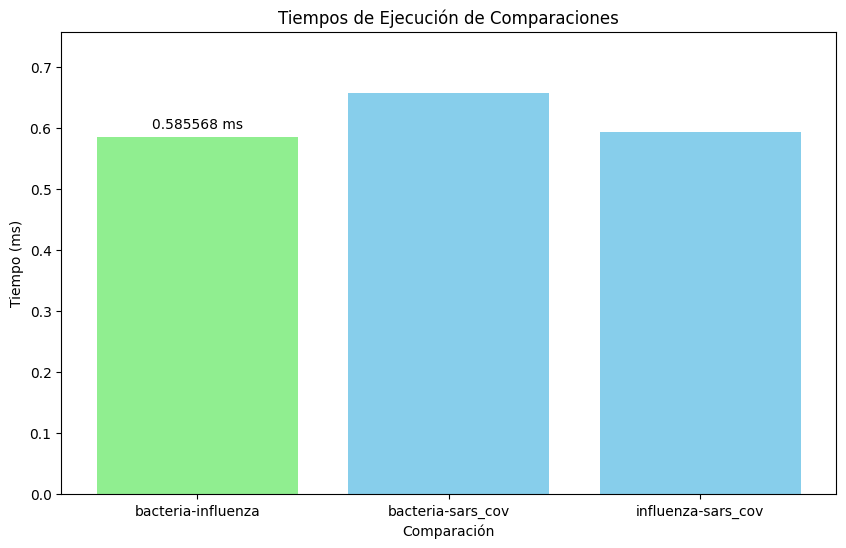

La comparación más rápida es: bacteria-influenza con un tiempo de 0.585568 ms


In [54]:
import matplotlib.pyplot as plt

# Datos
comparisons = ['bacteria-influenza', 'bacteria-sars_cov', 'influenza-sars_cov']
times = [0.585568, 0.657344, 0.593472]

# Determinar el más rápido
min_time = min(times)
min_index = times.index(min_time)
fastest_comparison = comparisons[min_index]

# Crear la gráfica
plt.figure(figsize=(10, 6))
plt.bar(comparisons, times, color='skyblue')
plt.xlabel('Comparación')
plt.ylabel('Tiempo (ms)')
plt.title('Tiempos de Ejecución de Comparaciones')
plt.ylim(0, max(times) + 0.1)  # Ajustar el límite superior para mayor claridad

# Resaltar el tiempo más rápido
plt.bar(fastest_comparison, min_time, color='lightgreen')
plt.text(fastest_comparison, min_time + 0.01, f'{min_time:.6f} ms', ha='center', va='bottom', color='black')

# Mostrar gráfica
plt.show()

# Imprimir el más rápido
print(f'La comparación más rápida es: {fastest_comparison} con un tiempo de {min_time:.6f} ms')


##Version realizada con python con el objetivo de graficar la matriz de puntuación

In [63]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
from numba import cuda

# Codificación de caracteres
def encode_sequence(sequence):
    unique_chars = sorted(set(sequence))
    char_to_int = {char: idx for idx, char in enumerate(unique_chars)}
    return np.array([char_to_int[char] for char in sequence], dtype=np.int32), len(unique_chars)

# Función CUDA para Needleman-Wunsch
@cuda.jit
def needleman_wunsch_kernel(s, t, M, D, n, m, match, mismatch, gap):
    i, j = cuda.grid(2)

    if i < n + 1 and j < m + 1:
        if i == 0:
            M[i, j] = j * gap
            D[i, j] = 2  # From left
        elif j == 0:
            M[i, j] = i * gap
            D[i, j] = 1  # From top
        else:
            score_diagonal = M[i - 1, j - 1] + (match if s[i - 1] == t[j - 1] else mismatch)
            score_up = M[i - 1, j] + gap
            score_left = M[i, j - 1] + gap
            M[i, j] = max(score_diagonal, score_up, score_left)

            # Direction matrix
            if M[i, j] == score_diagonal:
                D[i, j] = 0  # Diagonal
            elif M[i, j] == score_up:
                D[i, j] = 1  # Up
            else:
                D[i, j] = 2  # Left

def load_file(file_path):
    with open(file_path, 'r') as file:
        return file.read().strip()

def needleman_wunsch(s, t, match, mismatch, gap):
    # Codificar las secuencias
    s_encoded, _ = encode_sequence(s)
    t_encoded, _ = encode_sequence(t)

    n = len(s_encoded)
    m = len(t_encoded)

    # Transferir secuencias a dispositivo
    s_device = cp.asarray(s_encoded, dtype=cp.int32)
    t_device = cp.asarray(t_encoded, dtype=cp.int32)

    # Asignar memoria en el dispositivo
    M_device = cp.zeros((n + 1, m + 1), dtype=cp.int32)
    D_device = cp.zeros((n + 1, m + 1), dtype=cp.int32)

    # Configurar dimensiones del kernel
    threads_per_block = (16, 16)
    blocks_per_grid_x = (n + 15) // 16
    blocks_per_grid_y = (m + 15) // 16
    blocks_per_grid = (blocks_per_grid_x, blocks_per_grid_y)

    # Lanzar el kernel CUDA
    needleman_wunsch_kernel[blocks_per_grid, threads_per_block](s_device, t_device, M_device, D_device, n, m, match, mismatch, gap)

    # Transferir matrices de vuelta al host
    M = cp.asnumpy(M_device)
    D = cp.asnumpy(D_device)

    # Visualización de matrices
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Matriz de puntuaciones
    cax1 = axes[0].matshow(M, cmap='viridis')
    fig.colorbar(cax1, ax=axes[0])
    axes[0].set_title('Matriz de Score')
    axes[0].set_xlabel('Secuencia T')
    axes[0].set_ylabel('Secuencia S')

    # Matriz de dirección
    cax2 = axes[1].matshow(D, cmap='cool')
    fig.colorbar(cax2, ax=axes[1])
    axes[1].set_title('Matriz de Puntos (Dirección)')
    axes[1].set_xlabel('Secuencia T')
    axes[1].set_ylabel('Secuencia S')

    plt.show()

    # Backtracking para obtener los alineamientos óptimos
    aligned_s = ""
    aligned_t = ""
    i, j = n, m

    while i > 0 and j > 0:
        if D[i, j] == 0:  # Diagonal
            aligned_s = s[i - 1] + aligned_s
            aligned_t = t[j - 1] + aligned_t
            i -= 1
            j -= 1
        elif D[i, j] == 1:  # Up
            aligned_s = s[i - 1] + aligned_s
            aligned_t = "-" + aligned_t
            i -= 1
        else:  # Left
            aligned_s = "-" + aligned_s
            aligned_t = t[j - 1] + aligned_t
            j -= 1

    while i > 0:
        aligned_s = s[i - 1] + aligned_s
        aligned_t = "-" + aligned_t
        i -= 1
    while j > 0:
        aligned_s = "-" + aligned_s
        aligned_t = t[j - 1] + aligned_t
        j -= 1

    # Mostrar los resultados
    print("\nAlineamiento Optimo:")
    print(aligned_s)
    print(aligned_t)
    print("Score:", M[n, m])



ejemplo de clase


/usr/local/lib/python3.10/dist-packages/numba/cuda/dispatcher.py:536: NumbaPerformanceWarning: Grid size 1 will likely result in GPU under-utilization due to low occupancy.
  warn(NumbaPerformanceWarning(msg))


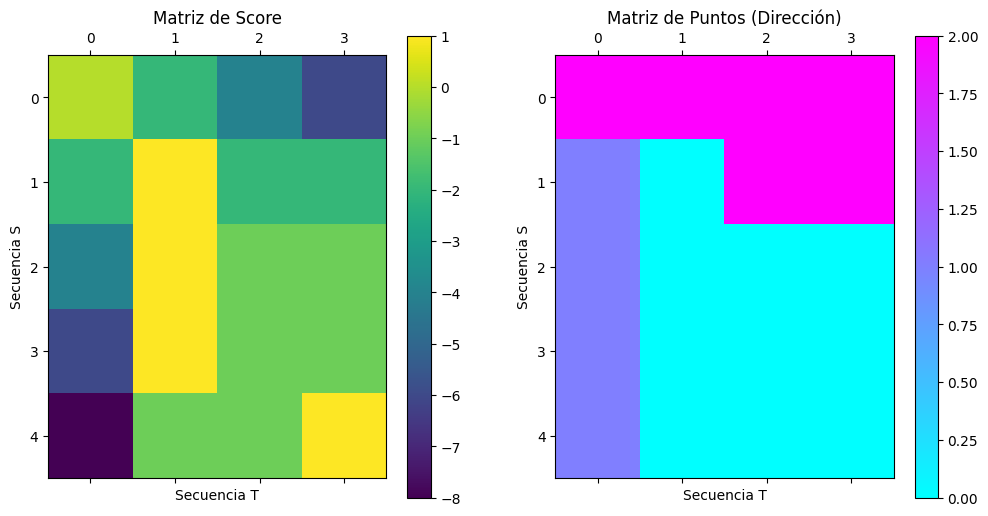


Alineamiento Optimo:
AAAC
-AGC
Score: 1


In [64]:
if __name__ == "__main__":
    # Leer datos de entrada desde archivos
    file1 = load_file('testBact.txt')
    file2 = load_file('testInfl.txt')

    match = 1
    mismatch = -1
    gap = -2

    # Ejecutar Needleman-Wunsch
    print("ejemplo de clase")
    needleman_wunsch(file1, file2, match, mismatch, gap)

ejemplo de clase


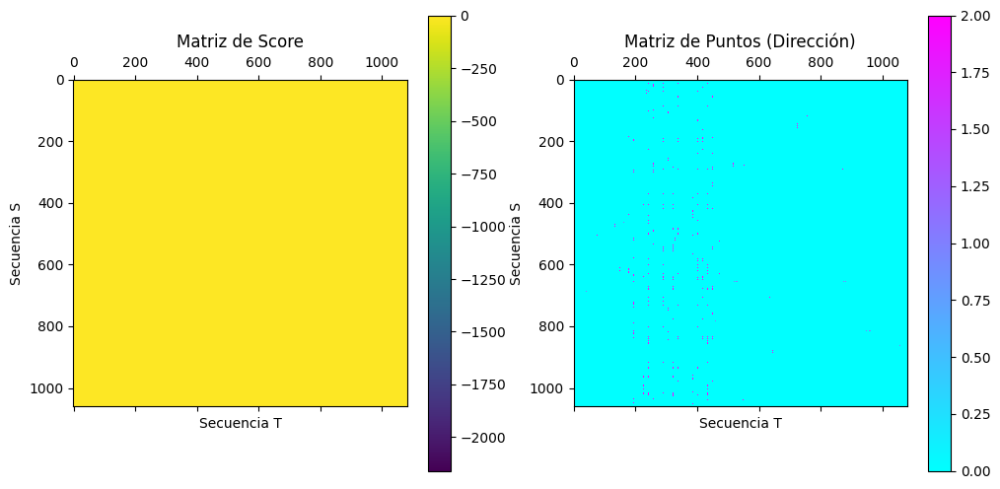


Alineamiento Optimo:
-t----------------caagcgttagagaagtcattatgtgataaaaaaattcaacttggtatcaacttaactaagggtcttggtgctggtgctttgcctgatgttggtaaaggtgcagcagaagaatcaattgatgaaattatggagcatataaaagatagccatatgctctttatcacagcagggatgggtggtggtactggaacaggtgctgcaccggtaattgcaaaagcagccagagaagcaagagcggtagttaaagataaaggagcaaaagaaaaaaagatactgactgttggagttgtaactaagccgttcggttttgaaggtgtgcgacgtatgcgcattgcagagcttggacttgaagagttgcaaaaatacgtagatacacttattgtcattcccaatcaaaatttatttagaattgctaacgagaaaactaca-tttgctgacgcatttcaactcgccgataatg-ttctgcatattggcataagaggagtaactgatttgatgatcatgccaggactgattaatcttgattttgctgatatagaaacagtaatgagtgagatgggtaaagcaatgattggtactggagaggcagaaggagaagatagggcaattagcgctgcagaggctgcgatatctaatccattacttgataatgtatcaatgaaaggtgcacaaggaatattaattaatattactggtggtggagatatgactctatttgaagttgatgctgcagccaatagagtgcgtgaagaagtcgatgaaaatgcaaatataatatttggtgccacttttgatcaggcgatggaaggaagagttagagtttctattcttgcaactggcattgatagctgtaacgacaattcatctgttaatcaaaacaagatcccagca-gaggaaaaaaattttaaatggccttataatcaagttcctatatcagaaacaaaagaatatgcttca

In [65]:
if __name__ == "__main__":
    # Leer datos de entrada desde archivos
    file1 = load_file('bacteria.txt')
    file2 = load_file('influenza.txt')

    match = 1
    mismatch = -1
    gap = -2

    # Ejecutar Needleman-Wunsch
    print("ejemplo de clase")
    needleman_wunsch(file1, file2, match, mismatch, gap)

ejemplo de clase


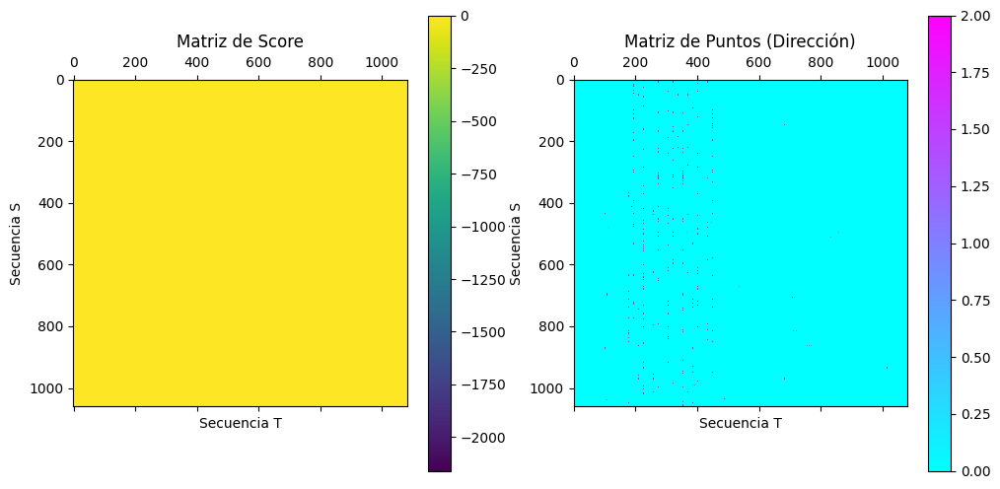


Alineamiento Optimo:
-t----------------caagcgttagagaagtcattatgtgataaaaaaattcaacttggtatcaacttaactaagggtcttggtgctggtgctttgcctgatgttggtaaaggtgcagcagaagaatcaattgatgaaattatggagcatataaaagatagccatatgctctttatcacagcagggat-gggtggtggtactggaacaggtgctgcaccggtaattgcaaaagcagccagagaagcaagagcggtagttaaagataaaggagcaaaagaaaaaaagatactgactgttggagttgtaactaagccgttcggttttgaaggtgtgcgacgtatgcgcattgcagagcttggacttgaagagttgcaaaaatacgtagatacacttattgtcattcccaatcaaaatttatttagaattgctaacgagaaaactacatttgctgacgcatttcaactcgccgataatgttctgcatattggcataagaggagtaactgatttgatgatcatgccaggactgattaatcttgattttgctgatatagaaacagtaatgagtgagatgggtaaagcaatgattggtactggagaggcagaaggagaagatagggcaattagcgctgcagaggctgcgatatctaatccattacttgataatgtatcaatgaaaggtgcacaaggaatattaattaatattactggtggtg-gagatatgactctatttgaagttgatgctgc-agccaatagagtgcgtgaagaagtcgatgaaaatgcaaatataatatttggtgccacttttgatcaggcgatggaaggaagagttagagtttctattcttgcaactggcattgatagctgtaacgacaattcatctgttaatcaaaacaagatcccagcagaggaaaaaaattttaaatggccttataatcaagttcctatatcagaaacaaaagaatatgcttca

In [66]:
if __name__ == "__main__":
    # Leer datos de entrada desde archivos
    file1 = load_file('bacteria.txt')
    file2 = load_file('sars_cov.txt')

    match = 1
    mismatch = -1
    gap = -2

    # Ejecutar Needleman-Wunsch
    print("ejemplo de clase")
    needleman_wunsch(file1, file2, match, mismatch, gap)

ejemplo de clase


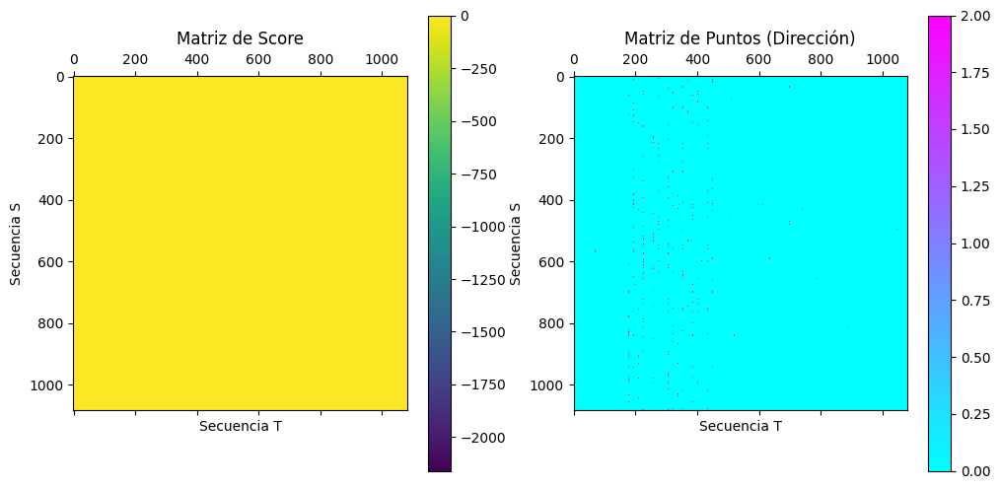


Alineamiento Optimo:
atggaagcaatatcactgatgactatactactggtggtaacaacaagtaatgcagacaaaatctgcatcggtcaccaatcaacaaattccacggaaactgtagacacgctaacagaaacaaatgttcctgtaacacaagccaaagaattgctccacacagaacacaatgggatgctatgtgcaacaaatctgggacgtcctcttatcctagacacatgcaccattgaaggactgatctatggcaacccatcttgtgacatgctgttaggaggaagggaatggtcctacatcgtcgaaagaccgtccgcagtaaatggaacatgctaccctggaaatgtagaaaacctagaggaacttagaacactttttagctcctctagttcttaccaaagagtccaactctttccagactcaatctg-gaatgtgacttacactgggacaagcaaatcatgttcagattcattctataggaatatgagatggttaactcaaaagaatgggggttatccaattcaagatgcccagtacacaaacaataggggaaaggacattcttttcgtgtggggcatacatcatccaccaaccgatactgcacagacgaatttatatacaaggaccgacacaacaacaagtgtaacaacggagactttagataggaccttcaaaccattgatagggccaaggccccttgtcaatggtctaattggaagaattaattactattggtcggtactaaaaccaggccaaacgttgcgagtgagatcaaatggaaatctaattgctccatggtttggacatgttctctcaggtgagagccatgtgagaatcctgagaactgatttaagcagcggtaattgtgtggtacaatgccagactgaaaaaggtggcctaaacagtacaatgccatttcacaacatcagcaaatatgcttttgggacctgtcccaaatatattggagtcaagagtctcaaactggc

In [67]:
if __name__ == "__main__":
    # Leer datos de entrada desde archivos
    file1 = load_file('influenza.txt')
    file2 = load_file('sars_cov.txt')

    match = 1
    mismatch = -1
    gap = -2

    # Ejecutar Needleman-Wunsch
    print("ejemplo de clase")
    needleman_wunsch(file1, file2, match, mismatch, gap)